# Notebook 03 (V4_3) — Fixed-$\nu_b$ AHP Pattern at $T_{solved}=110$

This independent replication keeps the AHP-matching `pathwise_hi_exp_pi075` calibration for every primitive except the requested equilibrium specification: $\nu_b=1=\xi_W$ and `common_world_growth=false`. The first 15 periods are retained as the source AHP evidence window, while periods 16–110 show the fixed-$\nu_b$ counterfactual tail.

The source calibration search is not rerun and the common-growth source tree is never included. Its saved CSV artifacts are read only as immutable benchmarks. All model code, continuation scripts, sweeps, figures, and exports used here are local to `Two_country_proudction_fixed_nu_b`.


## Why this solves at 110

The workflow retains Notebook 17's successful long-horizon numerical strategy but applies it to the fixed-$\nu_b$ model:

- `n_buffer = 0`, so requested and reported horizons coincide;
- the decay-consistent local log-linear artificial successor for period `T+1`;
- warm continuation through `30, 45, 60, 70, 80, 90, 100, 105, 110`; and
- an escalating branch-iteration schedule of `60, 200` when a stage needs a retry.

The AHP accounting uses the direct equilibrium identity `NFA = A - Q_US`, avoiding an unrelated terminal fundamental-value recursion. Equality to the source common-growth path is reported as a diagnostic, not imposed as a validity gate.


In [1]:
function nb03_notebook_project_dir(start_dir=pwd())
    dir = abspath(start_dir)
    while true
        for candidate in (dir, joinpath(dir, "Codes"))
            script = joinpath(candidate, "Two_country_proudction_fixed_nu_b",
                              "03_v9_ahp_pattern_T110_replication_fixed_nu_b.jl")
            isfile(script) && return candidate
        end
        parent = dirname(dir)
        parent == dir && error("Could not locate the fixed-nu_b Notebook 03 script")
        dir = parent
    end
end

nb03_project_dir = nb03_notebook_project_dir()
include(joinpath(nb03_project_dir, "Two_country_proudction_fixed_nu_b",
                 "03_v9_ahp_pattern_T110_replication_fixed_nu_b.jl"))


  Activating 

Project directory:             /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes

project at `~/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes`



Output directory:              /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_fixed_nu_b/outputs_fixed_nu_b/03_ahp_pattern_T110_replication
Requested solved horizon:      110
Scratch buffer:                0
Fixed nu_b = xi_W:             1.0
Common-growth restriction:     disabled
Source calibration benchmark:  /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_common_growth/outputs_v43/ahp_pattern_first_window_common_growth_search
Warm-continuation horizons:    

[30, 45, 60, 70, 80, 90, 100, 105, 110]
Branch-iteration schedule:     [60, 200]
Solving T=30, buffer=0, branch_iters=60, warm_T=


Solving T=45, buffer=0, branch_iters=60, warm_T=30
Solving T=60, buffer=0, branch_iters=60, warm_T=45


Solving T=70, buffer=0, branch_iters=60, warm_T=60
Solving T=80, buffer=0, branch_iters=60, warm_T=70
Solving T=90, buffer=0, branch_iters=60, warm_T=80
Solving T=100, buffer=0, branch_iters=60, warm_T=90
Solving T=105, buffer=0, branch_iters=60, warm_T=100
Solving T=110, buffer=0, branch_iters=60, warm_T=105


NOTEBOOK 03 — FIXED-NU_B AHP FIGURES ON THE T=110 CONTINUATION
Final max u residual:             4.709e-07
Final max BGP residual:           9.412e-10
Max first-window replication err: 5.958e-03
Matches source common-growth path: 

false
t=15 rebased NFA:                 -0.043895
t=15 net VA / cumulative CA:      -0.052476 / +0.008581
|VA| / |CA|:                      6.115
Fixed nu_b_eff range:             [1.000000, 1.000000]
CG-implied reference nu_b range:  [0.362088, 1.920378]
Maximum common-growth log gap (diagnostic): 5.180e-02
Hard-valid T=110 solution:         true
Artifacts written to:             /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_fixed_nu_b/outputs_fixed_nu_b/03_ahp_pattern_T110_replication


## Fixed-nu_b Notebook 15 figure comparison on the full solution

The original styling is retained: the first-window series are opaque and the post-15 tail is muted.

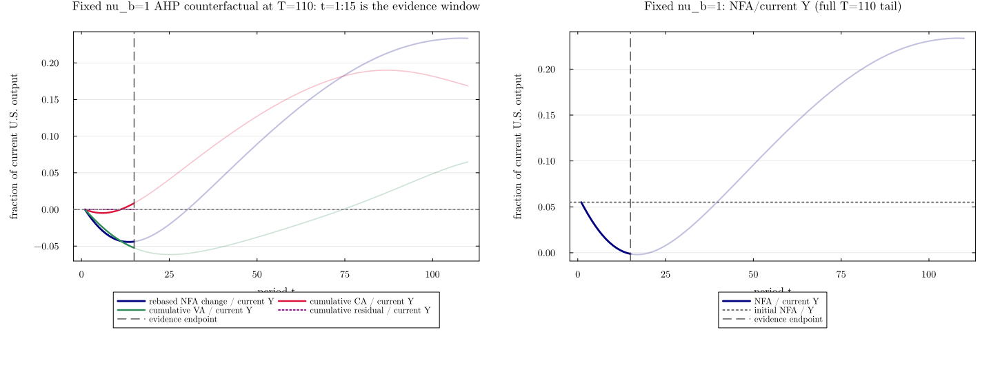

In [2]:
fig_ahp_two_panel

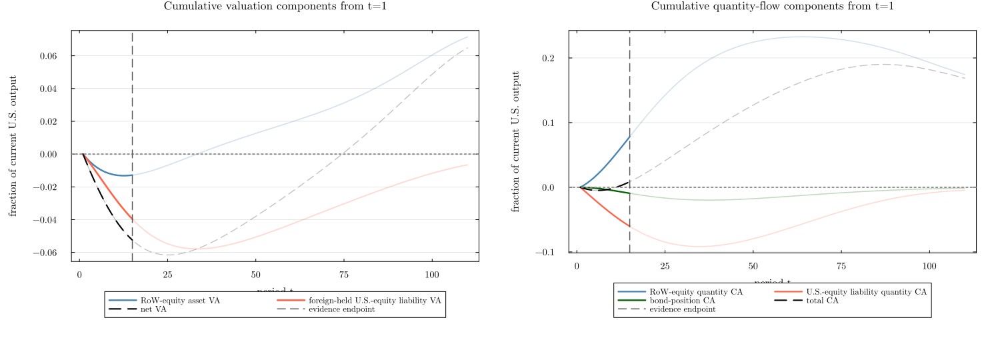

In [3]:
fig_subcomponents

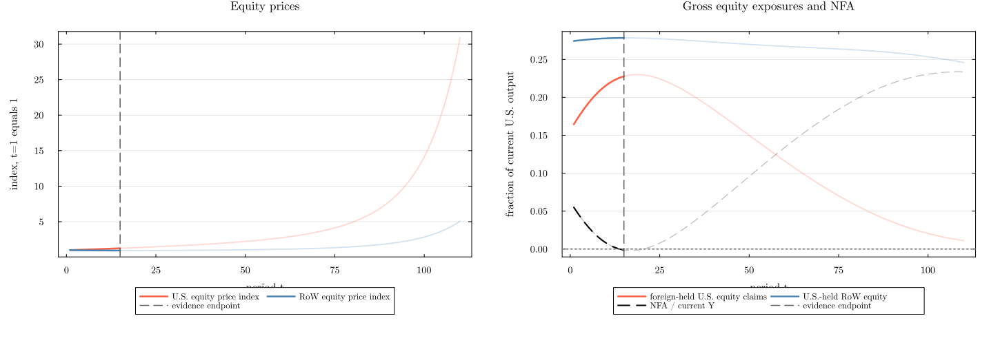

In [4]:
fig_prices_exposures

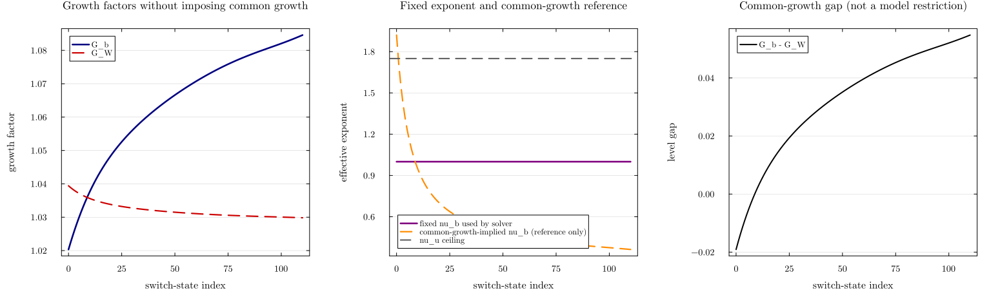

In [5]:
fig_common_growth

## Certification Summary

The solve cell requires model hard validity under fixed $\nu_b=1$: equilibrium residuals, feasibility and interiority gates, exact NFA accounting, convergence of the extended absorbing-BGP sequence, and the exponent ordering needed by the downstream HKT diagnostics. The common-growth equation and equality to the source first-window path are reported only as counterfactual diagnostics; neither is an assertion.


In [6]:
@printf("T_solved:                         %d\n", T_solved)
@printf("Model hard-valid solution:        %s\n", best_validity.valid)
@printf("Fixed nu_b / xi_W:                %.1f / %.1f\n",
        best_result.params.ν_b, best_result.params.ξ_W)
@printf("Maximum u residual:               %.3e\n", best_result.max_u_residual)
@printf("Maximum BGP residual:             %.3e\n", best_result.max_bgp_residual)
@printf("First-window gap vs CG source:    %.3e\n", nb19_max_first_window_error)
println("Matches source path tolerance:     ", nb19_first_window_matches_source)
@printf("t=15 rebased NFA / current Y:     %+.6f\n", best_metrics.target_rebased_nfa)
@printf("t=15 net VA / cumulative CA:      %+.6f / %+.6f\n",
        best_metrics.target_net_va, best_metrics.target_ca)
@printf("Maximum common-growth log gap (diagnostic): %.3e\n",
        best_common_summary.max_log_gap)
println("Artifacts:                         ", NB19_OUTDIR)


T_solved:                         110
Model hard-valid solution:        true
Fixed nu_b / xi_W:                1.0 / 1.0
Maximum u residual:               4.709e-07
Maximum BGP residual:             9.412e-10
First-window gap vs CG source:    5.958e-03
Matches source path tolerance:     false
t=15 rebased NFA / current Y:     -0.043895
t=15 net VA / cumulative CA:      -0.052476 / +0.008581
Maximum common-growth log gap (diagnostic): 5.180e-02
Artifacts:                         /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_fixed_nu_b/outputs_fixed_nu_b/03_ahp_pattern_T110_replication


## Parameter Sweeps for Fixed-$\nu_b$ Bubble Bounds and Leakage Contributions

This section applies the source $\pi$ and $\gamma$ sweep grids to the fixed-$\nu_b$ AHP calibration. All unswept primitives remain at their AHP values, with $\nu_b=1=\xi_W$ and no common-growth restriction. The final horizon is `T_max = 105`, with `n_buffer = 0`.

For every parameter value, the equilibrium is extended by warm continuation through `30, 45, 60, 70, 80, 90, 100, 103, 104, 105`. The AHP baseline is solved first and supplies a state-matched parameter-continuation seed at the initial horizon; all later horizons use the preceding solution under the target parameterization. Thus a generic cold-start basin failure is not misclassified as nonexistence. The replication uses a declared 60-sweep budget per stage; a case that remains unsafe at that budget is exported as numerically unavailable rather than extrapolated. Set `NB03_FIXED_NU_B_SWEEP_BRANCH_ITER_SCHEDULE=60,200,500,1000` for the source notebook's exhaustive retry schedule. The theoretical bubble-share interval uses cutoff $K=103$ and checks its finite prefix against the separate `T=104` solution. The five displayed objects are the theoretical upper bound, theoretical lower bound, $a_t$, $d_t^u/q_t^u$, and weighted switch contribution $(1-\pi)L_t/\pi$.


In [7]:
include(joinpath(nb03_project_dir, "Two_country_proudction_fixed_nu_b",
                 "03_v9_ahp_pattern_T110_sweeps_T105_fixed_nu_b.jl"))



Two-country fixed-nu_b AHP-calibration parameter sweeps


Fixed nu_b = xi_W:             1.0
Common-growth restriction:     disabled
Final sweep horizon T_max:      105
Reference horizon:              104
Bound cutoff K:                 103
Endpoint guard:                 2
Branch-iteration retry budget:  [60]
π grid:                         

[0.7, 0.75, 0.8, 0.9, 0.95, 0.97, 0.99, 0.995]
γ grid:                         [0.05, 0.25, 0.5, 0.75, 0.9]
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 30 iter= 60 warm=
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 45 iter= 60 warm=30


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 60 iter= 60 warm=45
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 70 iter= 60 warm=60


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 80 iter= 60 warm=70
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 90 iter= 60 warm=80
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=100 iter= 60 warm=90
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=103 iter= 60 warm=100


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=104 iter= 60 warm=103
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=105 iter= 60 warm=104
pi           π = 0.7               T= 30 iter= 60 warm=30
pi           π = 0.8               T= 30 iter= 60 warm=30


pi           π = 0.8               T= 45 iter= 60 warm=30
pi           π = 0.8               T= 60 iter= 60 warm=45
pi           π = 0.8               T= 70 iter= 60 warm=60
pi           π = 0.8               T= 80 iter= 60 warm=70


pi           π = 0.8               T= 90 iter= 60 warm=80
pi           π = 0.8               T=100 iter= 60 warm=90
pi           π = 0.8               T=103 iter= 60 warm=100
pi           π = 0.8               T=104 iter= 60 warm=103


pi           π = 0.8               T=105 iter= 60 warm=104
pi           π = 0.9               T= 30 iter= 60 warm=30
pi           π = 0.9               T= 45 iter= 60 warm=30
pi           π = 0.9               T= 60 iter= 60 warm=45


pi           π = 0.9               T= 70 iter= 60 warm=60
pi           π = 0.9               T= 80 iter= 60 warm=70
pi           π = 0.9               T= 90 iter= 60 warm=80
pi           π = 0.9               T=100 iter= 60 warm=90


pi           π = 0.9               T=103 iter= 60 warm=100
pi           π = 0.9               T=104 iter= 60 warm=103
pi           π = 0.9               T=105 iter= 60 warm=104
pi           π = 0.95              T= 30 iter= 60 warm=30


pi           π = 0.95              T= 45 iter= 60 warm=30
pi           π = 0.95              T= 60 iter= 60 warm=45
pi           π = 0.95              T= 70 iter= 60 warm=60
pi           π = 0.95              T= 80 iter= 60 warm=70


pi           π = 0.95              T= 90 iter= 60 warm=80
pi           π = 0.95              T=100 iter= 60 warm=90
pi           π = 0.95              T=103 iter= 60 warm=100
pi           π = 0.95              T=104 iter= 60 warm=103


pi           π = 0.95              T=105 iter= 60 warm=104
pi           π = 0.97              T= 30 iter= 60 warm=30


pi           π = 0.97              T= 45 iter= 60 warm=30
pi           π = 0.97              T= 60 iter= 60 warm=45
pi           π = 0.97              T= 70 iter= 60 warm=60
pi           π = 0.97              T= 80 iter= 60 warm=70


pi           π = 0.99              T= 30 iter= 60 warm=30
pi           π = 0.99              T= 45 iter= 60 warm=30
pi           π = 0.995             T= 30 iter= 60 warm=30
pi           π = 0.995             T= 45 iter= 60 warm=30
gamma        γ = 0.05              T= 30 iter= 60 warm=30
gamma        γ = 0.05              T= 45 iter= 60 warm=30


gamma        γ = 0.05              T= 60 iter= 60 warm=45
gamma        γ = 0.05              T= 70 iter= 60 warm=60
gamma        γ = 0.05              T= 80 iter= 60 warm=70
gamma        γ = 0.05              T= 90 iter= 60 warm=80


gamma        γ = 0.05              T=100 iter= 60 warm=90
gamma        γ = 0.05              T=103 iter= 60 warm=100
gamma        γ = 0.05              T=104 iter= 60 warm=103
gamma        γ = 0.05              T=105 iter= 60 warm=104


gamma        γ = 0.5               T= 30 iter= 60 warm=30
gamma        γ = 0.5               T= 45 iter= 60 warm=30


gamma        γ = 0.5               T= 60 iter= 60 warm=45
gamma        γ = 0.5               T= 70 iter= 60 warm=60
gamma        γ = 0.5               T= 80 iter= 60 warm=70
gamma        γ = 0.5               T= 90 iter= 60 warm=80
gamma        γ = 0.5               T=100 iter= 60 warm=90
gamma        γ = 0.5               T=103 iter= 60 warm=100


gamma        γ = 0.5               T=104 iter= 60 warm=103
gamma        γ = 0.5               T=105 iter= 60 warm=104
gamma        γ = 0.75              T= 30 iter= 60 warm=30
gamma        γ = 0.75              T= 45 iter= 60 warm=30


gamma        γ = 0.75              T= 60 iter= 60 warm=45
gamma        γ = 0.75              T= 70 iter= 60 warm=60
gamma        γ = 0.75              T= 80 iter= 60 warm=70
gamma        γ = 0.75              T= 90 iter= 60 warm=80
gamma        γ = 0.75              T=100 iter= 60 warm=90
gamma        γ = 0.75              T=103 iter= 60 warm=100


gamma        γ = 0.75              T=104 iter= 60 warm=103
gamma        γ = 0.75              T=105 iter= 60 warm=104
gamma        γ = 0.9               T= 30 iter= 60 warm=30
gamma        γ = 0.9               T= 45 iter= 60 warm=30


gamma        γ = 0.9               T= 60 iter= 60 warm=45
gamma        γ = 0.9               T= 70 iter= 60 warm=60
gamma        γ = 0.9               T= 80 iter= 60 warm=70
gamma        γ = 0.9               T= 90 iter= 60 warm=80


gamma        γ = 0.9               T=100 iter= 60 warm=90
gamma        γ = 0.9               T=103 iter= 60 warm=100
gamma        γ = 0.9               T=104 iter= 60 warm=103
gamma        γ = 0.9               T=105 iter= 60 warm=104

U.S. NFA sweep-accounting validation


pi       cases=4  max normalized decomposition error=5.545e-17
gamma    cases=3  max normalized decomposition error=5.977e-17



Sweep certification summary
sweep        case                max u res  prefix gap prefix ok   finite env bound status
pi           π = 0.7                                       false        false unavailable at T=30
pi           π = 0.75 (AHP)      3.730e-07   5.425e-05      true         true diagnostic_only_hkt_gate_failed
pi           π = 0.8             4.547e-07   5.083e-05      true         true diagnostic_only_hkt_gate_failed


pi           π = 0.9             5.236e-07   3.505e-05      true         true diagnostic_only_hkt_gate_failed
pi           π = 0.95            5.680e-07   2.612e-05      true         true diagnostic_only_hkt_gate_failed
pi           π = 0.97                                      false        false unavailable at T=80
pi           π = 0.99                                      false        false unavailable at T=45
pi           π = 0.995                                     false        false unavailable at T=45
gamma        γ = 0.05            4.318e-07   8.329e-05      true         true diagnostic_only_hkt_gate_failed
gamma        γ = 0.25 (AHP)      3.730e-07   5.425e-05      true         true diagnostic_only_hkt_gate_failed
gamma        γ = 0.5             3.294e-07   5.543e-05      true         true diagnostic_only_hkt_gate_failed
gamma        γ = 0.75                                      false        false unavailable at T=105
gamma        γ = 0.9                                     

### Sweep over persistence $\pi$

The single-country grid is retained, and $\pi=0.75$ is added and marked as the fixed-nu_b AHP baseline.

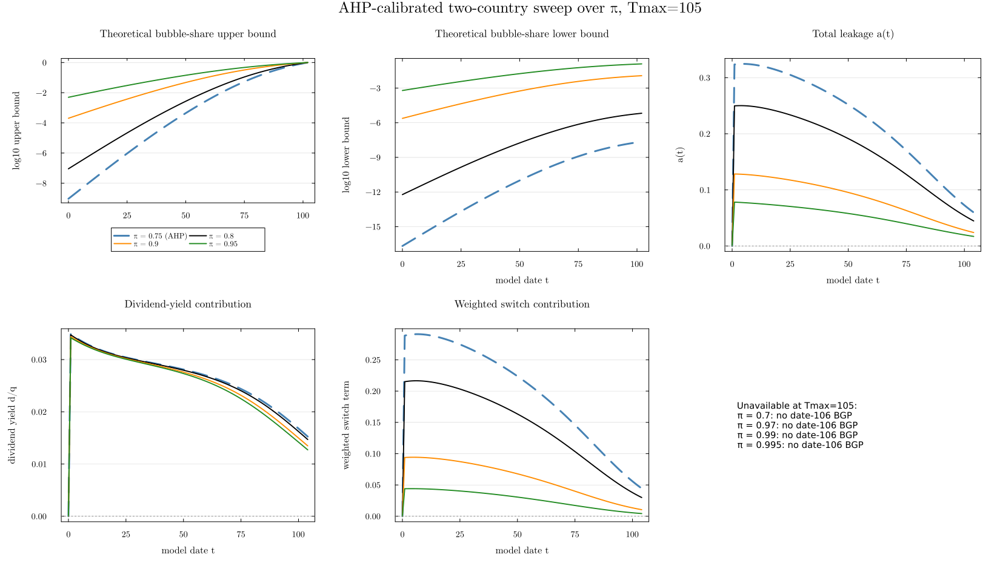

In [8]:
pi_sweep_five_quantity_fig

### Sweep over risk aversion $\gamma$

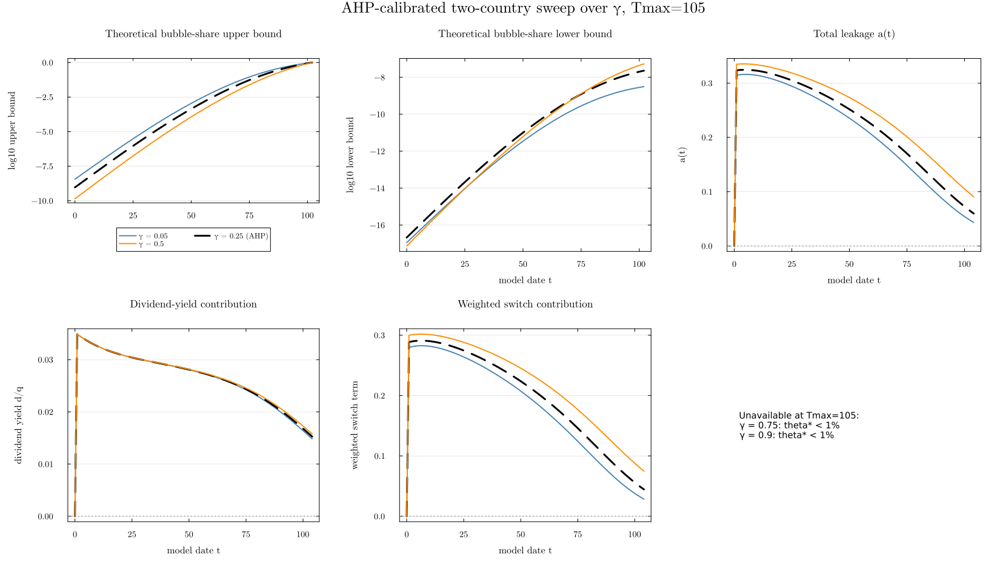

In [9]:
gamma_sweep_five_quantity_fig

### U.S. NFA decomposition over persistence $\pi$

The following 12-panel figure uses the same hard-valid $T_{\max}=105$ persistence cases as the five-quantity bubble-bound figure. U.S. NFA is rebased at the initial model date; NFA, valuation, current-account, and gross-position series are divided by current U.S. output, while equity prices are indexed to one initially. The duplicated `RoW-equity asset VA` in the request is interpreted as `U.S.-equity liability VA`.

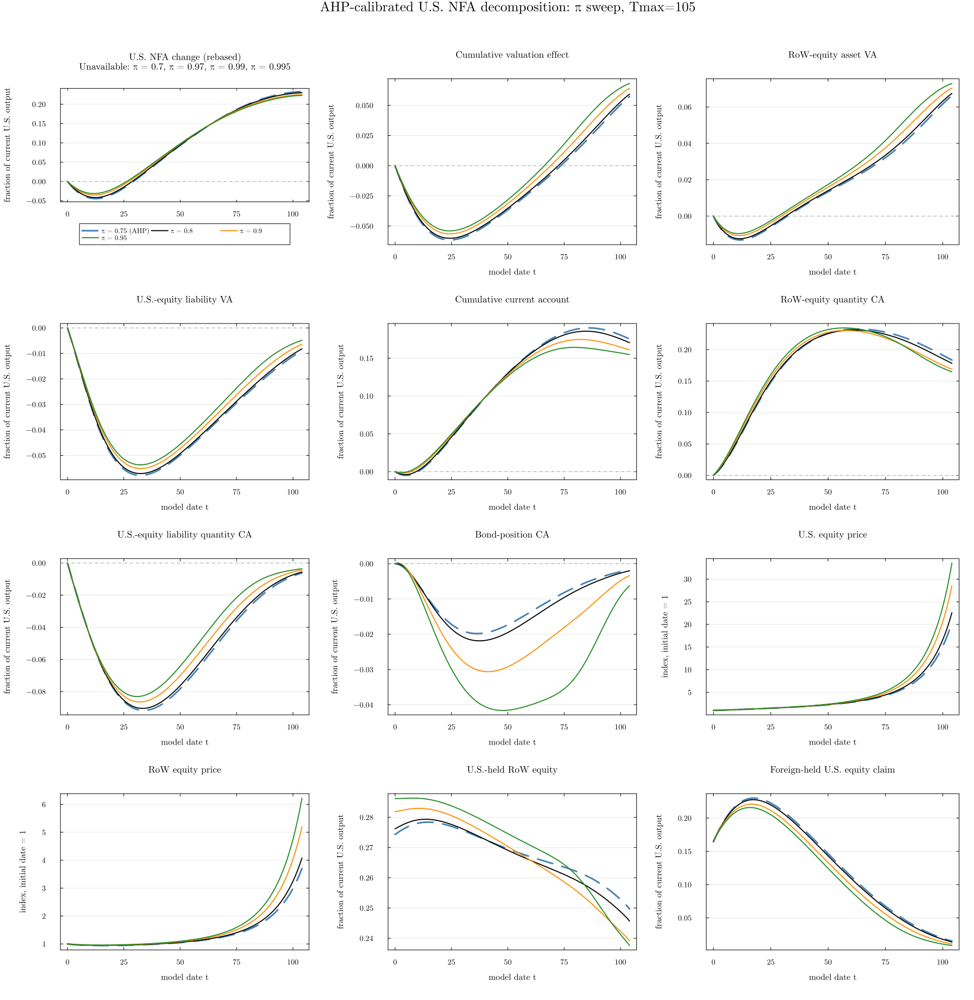

In [10]:
pi_sweep_nfa_figure

### U.S. NFA decomposition over risk aversion $\gamma$

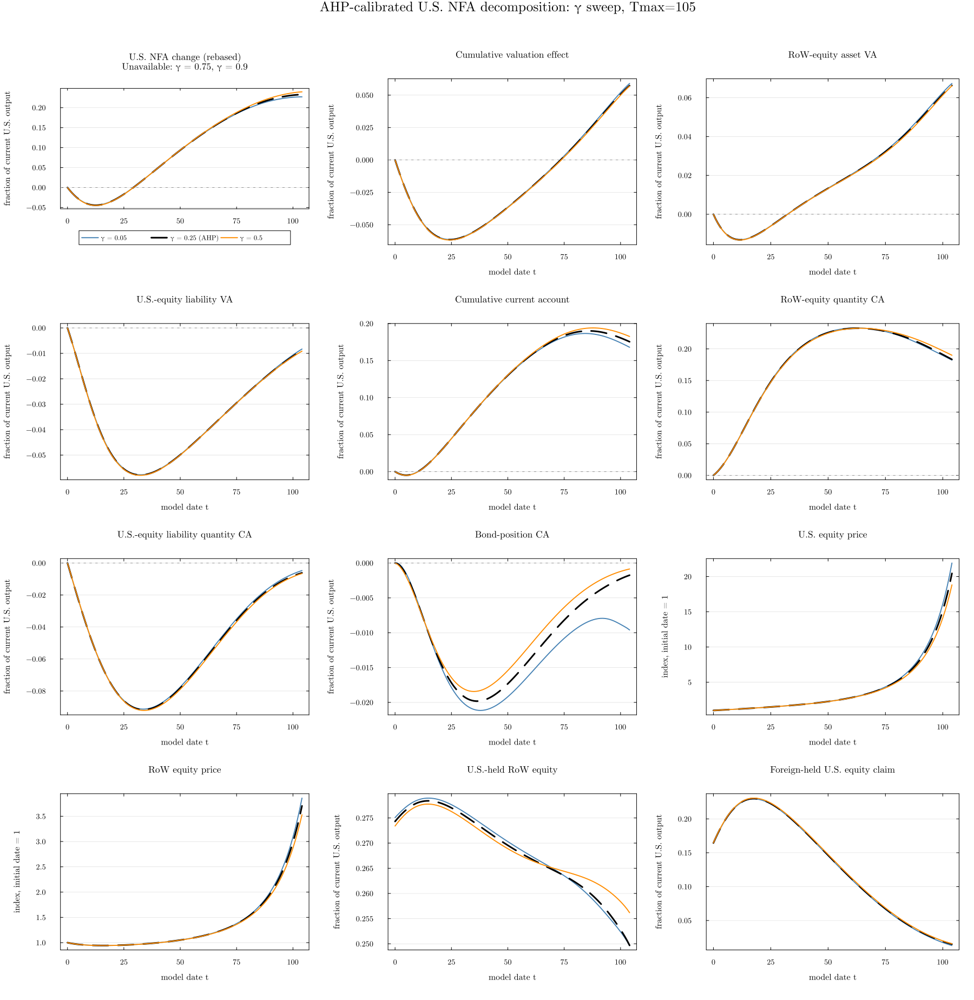

In [11]:
gamma_sweep_nfa_figure

### Econometric and Theoretical Qualification

These are comparative-static exercises around the fixed-$\nu_b$ version of the AHP calibration, not fresh AHP calibrations at every grid point. At `T_max=105`, a plotted lower bound remains conditional on the finite-tail envelope diagnostics and on extending the stated uniform premises beyond the solved horizon. The CSV summary reports the independent HKT entry gate separately and does not label a conditional diagnostic as a certified infinite-horizon bound.

Unavailable fixed-$\nu_b$ grid points are retained and annotated rather than silently dropped. Their numerical continuation frontiers and regularity-gate outcomes must be learned from this run; the outcomes of the source common-growth notebook are not carried over.


In [12]:
all_sweep_cases = vcat(pi_sweep_cases, gamma_sweep_cases)
solved_sweep_cases = vcat(pi_sweep_results, gamma_sweep_results)
unavailable_sweep_cases = filter(c -> c.status != :ok, all_sweep_cases)
unavailable_labels = join([c.label for c in unavailable_sweep_cases], ", ")
println("Requested sweep cases:             ", length(all_sweep_cases))
println("Hard-valid T_max=105 cases:        ", length(solved_sweep_cases))
println("Unavailable T_max=105 cases:       ",
        isempty(unavailable_labels) ? "none" : unavailable_labels)
println("Finite-envelope diagnostics passing: ",
        count(r.bound.summary.finite_envelope_diagnostics_pass
              for r in solved_sweep_cases),
        " / ", length(solved_sweep_cases))
println("HKT entry gates passing at T_max=105: ",
        count(r.bound.summary.hkt_entry_gate
              for r in solved_sweep_cases),
        " / ", length(solved_sweep_cases))
println("Detailed qualification: ",
        joinpath(NB19_OUTDIR, "sweep_case_summary.csv"))

Requested sweep cases:             13
Hard-valid T_max=105 cases:        7
Unavailable T_max=105 cases:       π = 0.7, π = 0.97, π = 0.99, π = 0.995, γ = 0.75, γ = 0.9
Finite-envelope diagnostics passing: 7 / 7
HKT entry gates passing at T_max=105: 0

 / 7
Detailed qualification: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_fixed_nu_b/outputs_fixed_nu_b/03_ahp_pattern_T110_replication/sweep_case_summary.csv


## U.S. NFA Component Sweeps at $T=100$

This section keeps the fixed-$\nu_b$ AHP calibration fixed except for the portfolio-weight parameter being swept. It evaluates $\bar\omega^*\in\{0.25,0.30,0.40,0.50\}$ at $\bar\omega=0.50$ and $\bar\omega\in\{0.40,0.50,0.60,0.70\}$ at $\bar\omega^*=0.25$. Every figure contains one accounting quantity per subplot.

NFA, valuation, current-account, and gross-position objects are expressed as fractions of current U.S. output. Equity prices are indexed to one at the initial model date. The duplicated `RoW-equity asset VA` in the source request is interpreted as `U.S.-equity liability VA`, completing the two-sided valuation decomposition.

The fixed-$\nu_b$ baseline is extended to $T=100$ by horizon continuation. Comparative statics then use non-plotted 0.01 parameter bridges and warm-start both the unbalanced path and absorbing-BGP sequence. Requested points beyond the newly validated continuation frontier are reported as unavailable rather than extrapolated. The requested $\bar\omega=0.40$ point remains outside the maintained primitive domain $\bar\omega\in[0.5,1]$ independently of numerical performance.


In [13]:
include(joinpath(nb03_project_dir, "Two_country_proudction_fixed_nu_b",
                 "03_v9_ahp_nfa_sweeps_T100_fixed_nu_b.jl"))



Fixed-nu_b T=100 parameter sweeps for the U.S. NFA decomposition
Fixed nu_b = xi_W:             1.0
Common-growth restriction:     disabled
Warm-continuation horizons:    [30, 45, 60, 70, 80, 90, 100]
omega_bar_star grid:          [0.25, 0.3, 0.4, 0.5]
omega_bar grid:               [0.4, 0.5, 0.6, 0.7]
Fine parameter step:           0.01
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 30 iter= 60 seed=none:


NFA omega_star   omega_bar* = 0.25 (AHP)   T= 45 iter= 60 seed=horizon:30
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 60 iter= 60 seed=horizon:45
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 70 iter= 60 seed=horizon:60
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 80 iter= 60 seed=horizon:70
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 90 iter= 60 seed=horizon:80
NFA omega_star   omega_bar* = 0.25 (AHP)   T=100 iter= 60 seed=horizon:90


NFA omega_star_continuation omega_bar* continuation = 0.26 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.27 T=100 iter= 60 seed=parameter:100


NFA omega_star_continuation omega_bar* continuation = 0.28 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.29 T=100 iter= 60 seed=parameter:100
NFA omega_star   omega_bar* = 0.3          T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.31 T=100 iter= 60 seed=parameter:100


NFA omega_star_continuation omega_bar* continuation = 0.32 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.33 T=100 iter= 60 seed=parameter:100


NFA omega_star_continuation omega_bar* continuation = 0.34 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.35 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.36 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.37 T=100 iter= 60 seed=parameter:100


NFA omega_star_continuation omega_bar* continuation = 0.38 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.39 T=100 iter= 60 seed=parameter:100


NFA omega_star   omega_bar* = 0.4          T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.41 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.42 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.43 T=100 iter= 60 seed=parameter:100


NFA omega_star_continuation omega_bar* continuation = 0.44 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.45 T=100 iter= 60 seed=parameter:100


NFA omega_star_continuation omega_bar* continuation = 0.46 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.47 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.48 T=100 iter= 60 seed=parameter:100
NFA omega_star_continuation omega_bar* continuation = 0.49 T=100 iter= 60 seed=parameter:100


NFA omega_star   omega_bar* = 0.5          T=100 iter= 60 seed=parameter:100
NFA omega_star   omega_bar* = 0.5          T=100 iter=200 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.51 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.52 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.53 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.54 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.55 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.56 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.57 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.58 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.59 T=100 iter= 60 seed=parameter:100
NFA omega        omega_bar = 0.6           T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.61 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.62 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.63 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.64 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.65 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.66 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.67 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.68 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.69 T=100 iter= 60 seed=parameter:100
NFA omega        omega_bar = 0.7           T=100 iter= 60 seed=parameter:100



T=100 U.S. NFA sweep validation
sweep        case                        plotted hard gate    max u res   decomp err
omega_star   omega_bar* = 0.25 (AHP)        true      true    3.288e-07    4.551e-17


omega_star   omega_bar* = 0.3               true      true    4.724e-07    5.394e-17
omega_star   omega_bar* = 0.4               true      true    5.859e-07    4.508e-17
omega_star   omega_bar* = 0.5              false     false                          
omega        omega_bar = 0.4               false     false                          
omega        omega_bar = 0.5 (AHP)          true      true    3.288e-07    4.551e-17
omega        omega_bar = 0.6                true      true    5.588e-07    5.811e-17
omega        omega_bar = 0.7                true     false    7.290e-07    4.749e-17
Detailed diagnostics: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_fixed_nu_b/outputs_fixed_nu_b/03_ahp_pattern_T110_replication/nfa_sweep_T100_case_summary.csv


### Sweep over $\bar\omega^*$

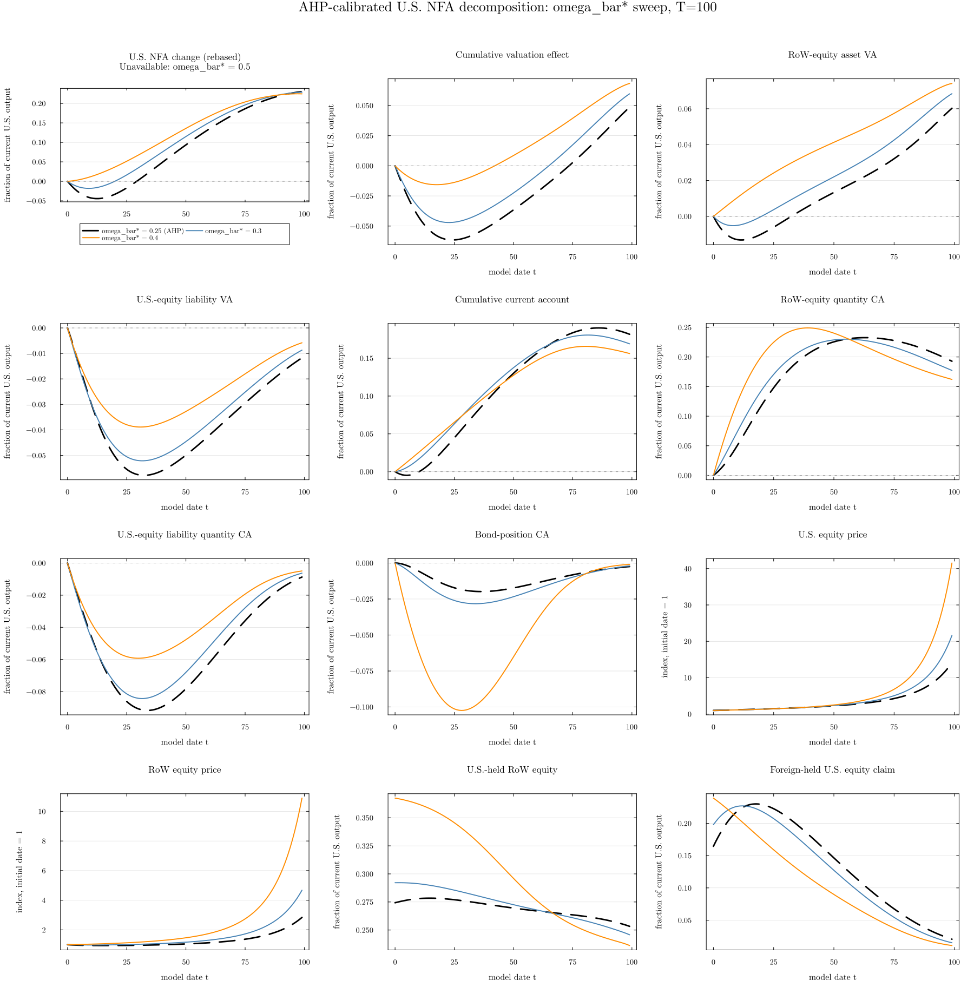

In [14]:
omega_star_nfa_sweep_figure

### Sweep over $\bar\omega$

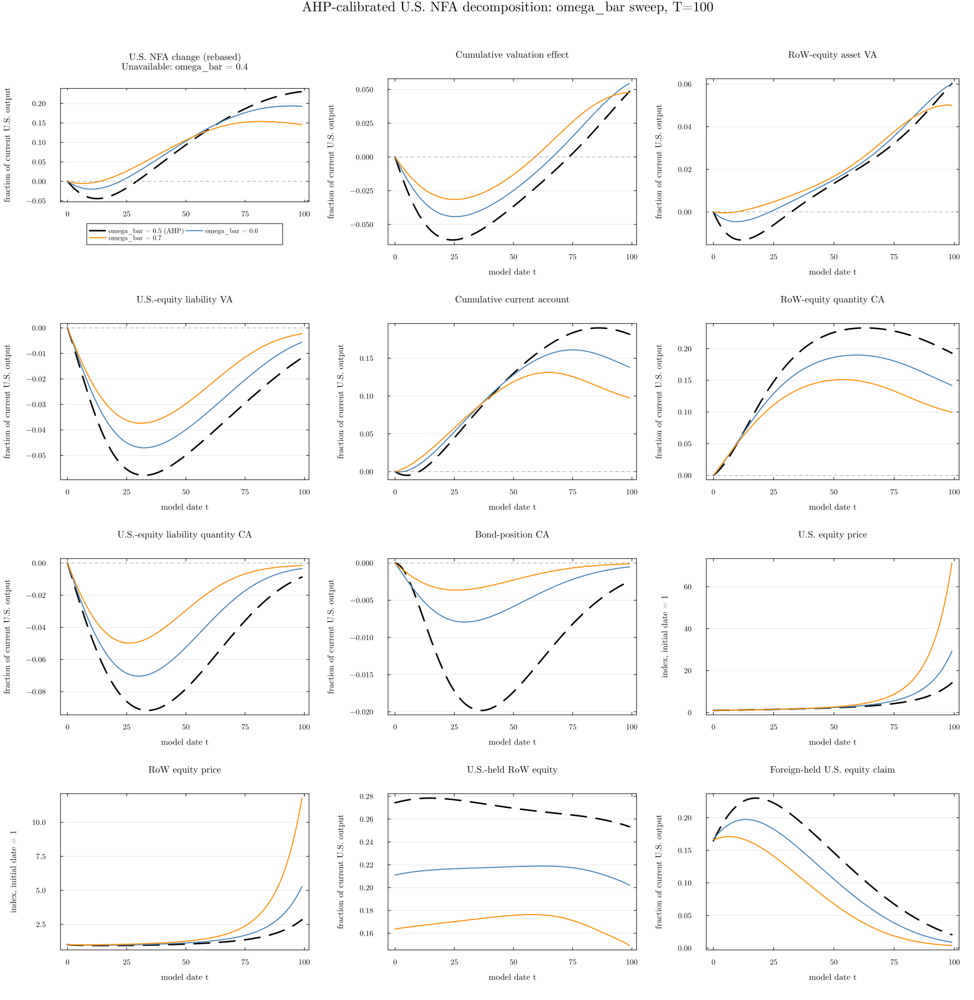

In [15]:
omega_nfa_sweep_figure

### Accounting and Feasibility Qualification

The first panel reports the change in U.S. NFA relative to its initial level, divided by current U.S. output. This is reconciled by cumulative valuation effects and cumulative current-account flows. Component panels use the same date-by-date valuation and quantity-flow accounting as the preceding fixed-$\nu_b$ AHP comparison.

The one-percent equity-weight and $\theta^*$ interiority screens are reported separately from strict economic feasibility. A residual-safe path with portfolio weights and $\theta^*$ strictly inside $(0,1)$ is plotted even when it lies within one percentage point of a boundary; the case summary identifies such observations. Each figure annotates requested cases that are not plotted, distinguishing a numerical continuation frontier from a primitive-domain violation. All reported outcomes are generated anew under fixed $\nu_b$.


In [16]:
all_nfa_sweep_cases = vcat(omega_star_nfa_sweep_cases, omega_nfa_sweep_cases)
println("Requested T=100 NFA sweep cases:  ", length(all_nfa_sweep_cases))
println("Plotted feasible cases:           ",
        count(c.plot_feasible for c in all_nfa_sweep_cases),
        " / ", length(all_nfa_sweep_cases))
println("Passing one-percent regularity gates: ",
        count(c.result !== nothing && c.validity.valid
              for c in all_nfa_sweep_cases),
        " / ", length(all_nfa_sweep_cases))
println("Detailed diagnostics: ",
        joinpath(NB19_OUTDIR, "nfa_sweep_T100_case_summary.csv"))

Requested T=100 NFA sweep cases:  8
Plotted feasible cases:           6 / 8
Passing one-percent regularity gates: 5 / 8
Detailed diagnostics: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_proudction_fixed_nu_b/outputs_fixed_nu_b/03_ahp_pattern_T110_replication/nfa_sweep_T100_case_summary.csv
